## Create dPb initial conditions based on Temperature and Salinity

In [1]:
import netCDF4 as nc
import numpy as np
import pandas as pd
import matplotlib
import xarray as xr
import pickle
import cmocean
import matplotlib.pyplot as plt

%matplotlib inline

#### Parameters

In [2]:
# domain dimensions:
imin, imax = 1139, 2179
jmin, jmax = 159, 799

#### Files

In [3]:
mesh         = nc.Dataset('/ocean/brogalla/GEOTRACES/data/ANHA12/ANHA12_mask_Pb-20220317.nc')
mesh_lon     = np.array(mesh.variables['nav_lon'])
mesh_lat     = np.array(mesh.variables['nav_lat'])
mesh_bathy   = np.array(mesh.variables['tmask'][0,:,:,:])
bathy_masked = np.ma.masked_where((mesh_bathy> 0.1), mesh_bathy)
ocean_masked = np.ma.masked_where((mesh_bathy<0.1), mesh_bathy)
depths       = np.array(mesh.variables['nav_lev'])

In [4]:
# temperature and salinity at start of time series:
df_gridT = xr.open_dataset(f'/data/brogalla/ANHA12/ANHA12-EXH006_5d_gridT_y2002m01d05.nc')
temp = df_gridT['votemper'].values[0,:,:,:]
sal  = df_gridT['vosaline'].values[0,:,:,:]

In [5]:
# Some observational profiles
Pb_data   = pd.read_csv('/ocean/brogalla/GEOTRACES/data/Pb-paper-data.csv')
dPb_LS2   = Pb_data['LS2'][np.isfinite(Pb_data['LS2'])].astype('float')*1e3
dPb_BB2   = Pb_data['BB2'][np.isfinite(Pb_data['BB2'])].astype('float')*1e3
dPb_CB3   = Pb_data['CB3'][np.isfinite(Pb_data['CB3'])].astype('float')*1e3
dPb_CB4   = Pb_data['CB4'][np.isfinite(Pb_data['CB4'])].astype('float')*1e3
depth_LS2 = Pb_data['Depth'][np.isfinite(Pb_data['LS2'])].astype('float')
depth_BB2 = Pb_data['Depth.2'][np.isfinite(Pb_data['BB2'])].astype('float')
depth_CB3 = Pb_data['Depth.15'][np.isfinite(Pb_data['CB3'])].astype('float')
depth_CB4 = Pb_data['Depth.16'][np.isfinite(Pb_data['CB4'])].astype('float')

#### Functions

In [332]:
def create_IC(bdy_temp, bdy_sal):
    # Pb end-members:
    PML_Pb    = 3e-12   # Polar Mixed Layer Pb
    AW_Pb     = 30e-12  # Atlantic water Pb
    AO_Pb     = 6e-12   # Arctic water Pb
    AOAW_Pb   = 25e-12  # Arctic Atlantic water mixture WGC
    
    PML_temp  = -0.2    # Polar mixed layer temperature
    AW_sal    = 35.2    # Atlantic Water salinity
    AW_temp   = 5.2     # Atlantic Water temperature
    
    # Linear interpolate endpoints between PML and ACW:
    end_temp = [PML_temp, AW_temp] 
    end_dPb = [PML_Pb, AW_Pb]
    dPb_IC  = np.interp(bdy_temp, end_temp, end_dPb)
    
    # Labrador Sea deep atlantic water inflow:
    end_sal = [34.86, 34.875]
    end_dPb = [AOAW_Pb, AW_Pb]
    dPb_IC[(bdy_sal > 34.86) & (bdy_temp > 2.0)] = np.interp(bdy_sal[(bdy_sal > 34.86) & (bdy_temp > 2.0)], end_sal, end_dPb)
    
    # Baffin Bay subsurface WGC increase
    end_sal = [34.0, AW_sal]
    end_dPb = [AO_Pb, AW_Pb]
    dPb_IC[:,:imax-500,:][(bdy_sal[:,:imax-500,:] > 33.7) & (bdy_sal[:,:imax-500,:] < 34.4) & (bdy_temp[:,:imax-500,:] < 0.4)] = \
        np.interp(bdy_sal[:,:imax-500,:][(bdy_sal[:,:imax-500,:] > 33.7) & (bdy_sal[:,:imax-500,:] < 34.4) & (bdy_temp[:,:imax-500,:] < 0.4)], \
                  end_sal, end_dPb)
    
    dPb_IC[np.isnan(dPb_IC)] = 3e-12
    
    return dPb_IC

In [355]:
def save_file(ini_pb):    
    ini_pb_reshape = np.empty((1,50,2400,1632))
    ini_pb_reshape[0,:,:,:] = ini_pb
    
    file_write = xr.Dataset(
        {'dPb': (("time_counter","deptht","y","x"), ini_pb_reshape)}, 
        coords = {
            "time_counter": np.zeros(1),
            "deptht": np.zeros(50),
            "y": np.zeros(2400),
            "x": np.zeros(1632),
        },
        attrs = {
            "long_name":'Dissolved Pb concentration IC',
            "units":"kmol/m3"
        },
    )
    file_write.to_netcdf('/ocean/brogalla/GEOTRACES/data/Pb-20220831/Pb-ini-20220911.nc', unlimited_dims='time_counter')
    return

In [263]:
def plot_layer(variable, layer, vm1=(0,30), vm2=(0,8)):
    
    fig, ax1, ax2, proj1, proj2 = pickle.load(open('/ocean/brogalla/GEOTRACES/pickles/Pb-double.pickle','rb'))
    fig.suptitle(f'Depth: {depths[layer]:.1f} m', fontsize=7)
    
    x, y = proj1(mesh_lon[imin:imax,jmin:jmax], mesh_lat[imin:imax,jmin:jmax]) 
    plot_variable = np.ma.masked_where(mesh_bathy[layer,:,:] < 0.1, variable[layer,:,:])
    
    CB1 = proj1.pcolormesh(x, y, plot_variable[imin:imax,jmin:jmax]*1e12, cmap=cmocean.cm.thermal, vmin=vm1[0], vmax=vm1[1]) 
    CB2 = proj2.pcolormesh(x, y, plot_variable[imin:imax,jmin:jmax]*1e12, cmap=cmocean.cm.thermal, vmin=vm2[0], vmax=vm2[1]) 
    
    proj1.scatter(x[50,400], y[50,400],zorder=5, c='w', s=5)   # LS
    proj2.scatter(x[50,400], y[50,400],zorder=5, c='w', s=5)   # LS
    proj1.scatter(x[280,420], y[280,420],zorder=5, c='w', s=5) # BB
    proj2.scatter(x[280,420], y[280,420],zorder=5, c='w', s=5) # BB
    proj1.scatter(x[900,450], y[900,450],zorder=5, c='w', s=5) # CB
    proj2.scatter(x[900,450], y[900,450],zorder=5, c='w', s=5) # CB
    
    # Color bar: --------------------------------------------------------------------------------
    cbaxes1 = fig.add_axes([0.42, 0.14, 0.02, 0.38]);
    cbaxes2 = fig.add_axes([0.92, 0.14, 0.02, 0.38])
    CBar1   = plt.colorbar(CB1, ax=ax1, cax=cbaxes1); 
    CBar2   = plt.colorbar(CB2, ax=ax2, cax=cbaxes2); 
    for CB in [CBar1, CBar2]:
        CB.set_label('Dissolved Pb [pM]', fontsize=7)
        CB.ax.tick_params(axis='y', length=0, labelsize=7)
    
    return

In [293]:
def TSPb_profile(indx, indy, location=''):
    
    fig, ax = plt.subplots(1, 3, figsize=(6,3), dpi=300)
    for axis in ax.ravel():
        axis.tick_params(axis='both', labelsize=6)
        axis.invert_yaxis()
        axis.xaxis.tick_top()
        axis.xaxis.set_label_position('top') 
        axis.set_ylim(3500,0)

    fig.suptitle(f'{location}', fontsize=7)
    ax[0].set_xlabel('Temperature', fontsize=6)
    ax[1].set_xlabel('Salinity', fontsize=6)
    ax[2].set_xlabel('Dissolved Pb', fontsize=6)

    ax[0].set_ylabel('Depth [m]', fontsize=6) 
    ax[0].plot(temp[:,indx+imin,indy+jmin], depths) # BB
    ax[1].plot(sal[:,indx+imin,indy+jmin], depths) # BB
    ax[2].plot(overall_IC[:,indx+imin,indy+jmin]*1e12, depths) # BB

    plt.tight_layout()
    
    return

#### Calculate

In [333]:
overall_IC = create_IC(temp, sal)

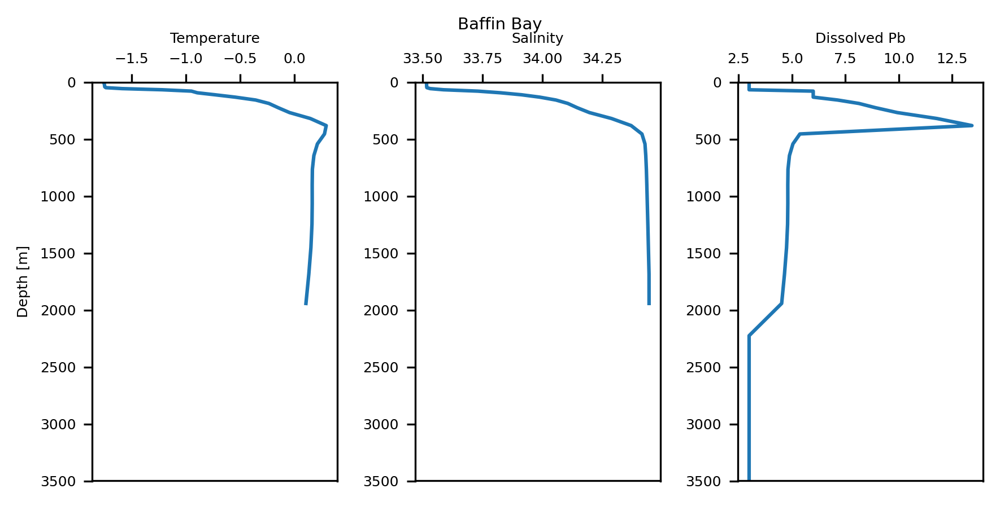

In [334]:
TSPb_profile(280, 420, location='Baffin Bay')

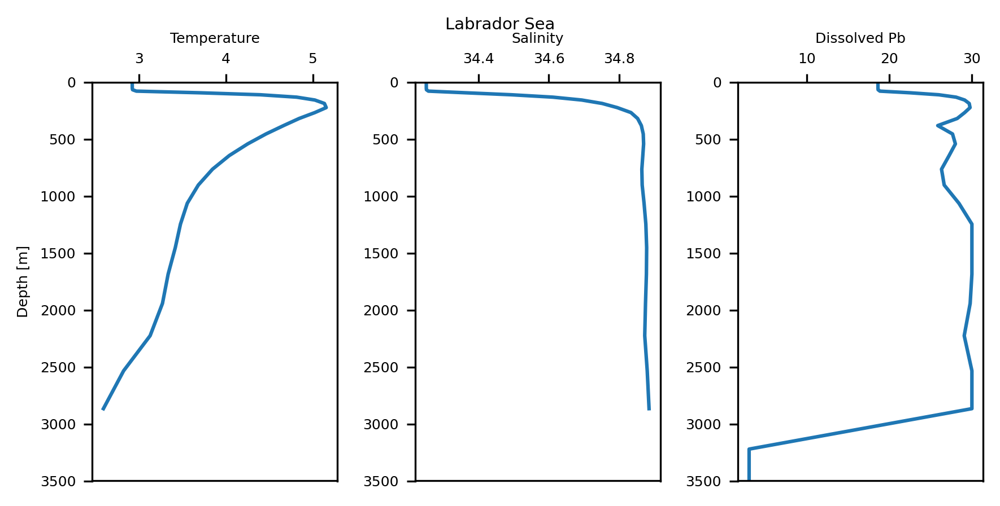

In [335]:
TSPb_profile(50, 400, location='Labrador Sea')

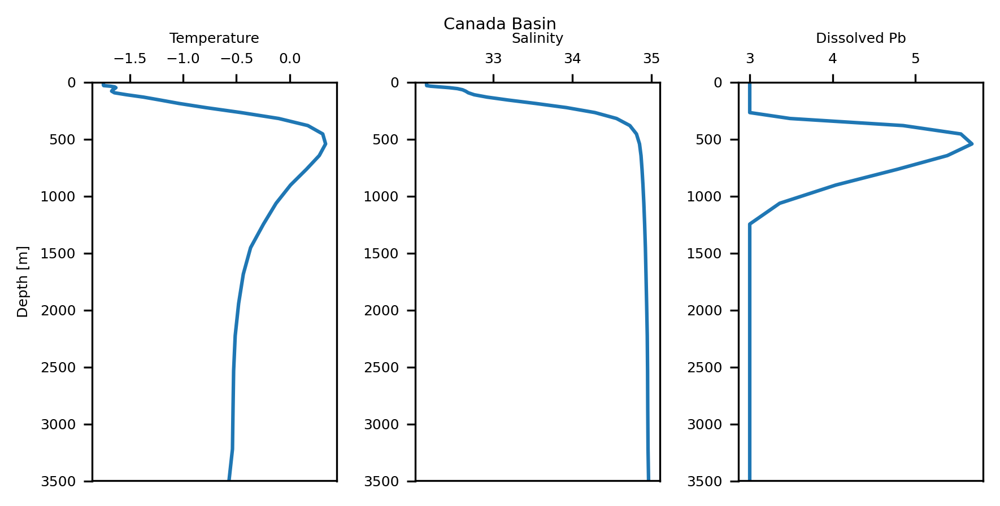

In [336]:
TSPb_profile(900, 450, location='Canada Basin')

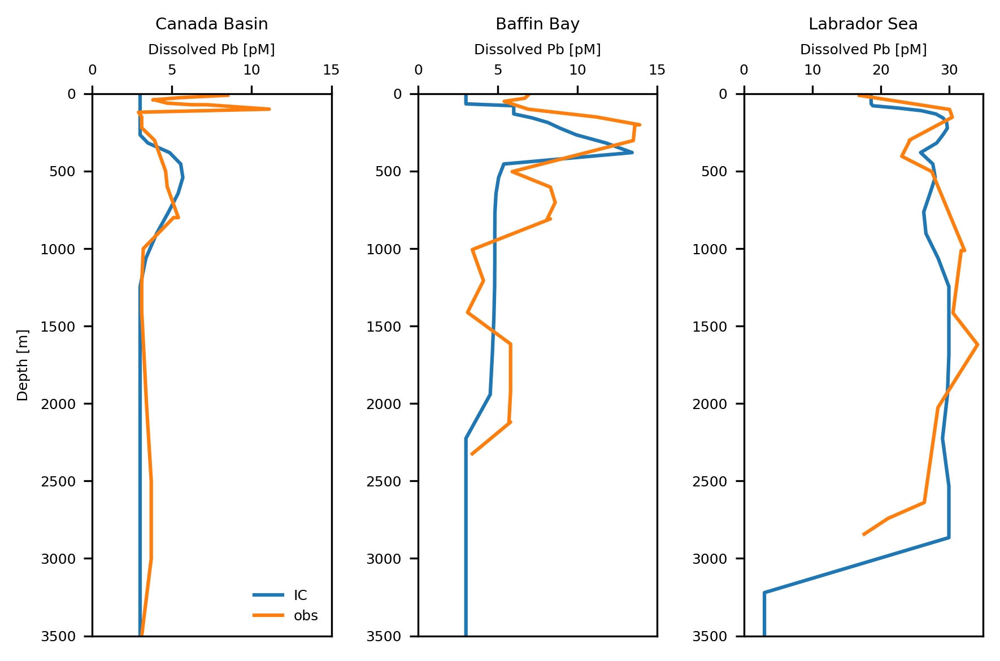

In [337]:
fig, ax = plt.subplots(1, 3, figsize=(6,4), dpi=300)
for axis in ax.ravel():
    axis.tick_params(axis='both', labelsize=6)
    axis.invert_yaxis()
    axis.set_xlabel('Dissolved Pb [pM]', fontsize=6)
    axis.xaxis.tick_top()
    axis.xaxis.set_label_position('top') 
    axis.set_xlim(0,15)
    axis.set_ylim(3500,0)
    
ax[2].set_xlim(0,35)

ax[0].set_ylabel('Depth [m]', fontsize=6)
ax[0].set_title('Canada Basin', fontsize=7)
ax[1].set_title('Baffin Bay', fontsize=7)
ax[2].set_title('Labrador Sea', fontsize=7)

ax[0].plot(overall_IC[:,900+imin,450+jmin]*1e12, depths, label='IC') # CB
ax[0].plot(dPb_CB4, depth_CB4, label='obs')
ax[1].plot(overall_IC[:,280+imin,420+jmin]*1e12, depths) # BB
ax[1].plot(dPb_BB2, depth_BB2)
ax[2].plot(overall_IC[:,50+imin,400+jmin]*1e12, depths)  # LS
ax[2].plot(dPb_LS2, depth_LS2)

ax[0].legend(fontsize=6, frameon=False)
plt.tight_layout()

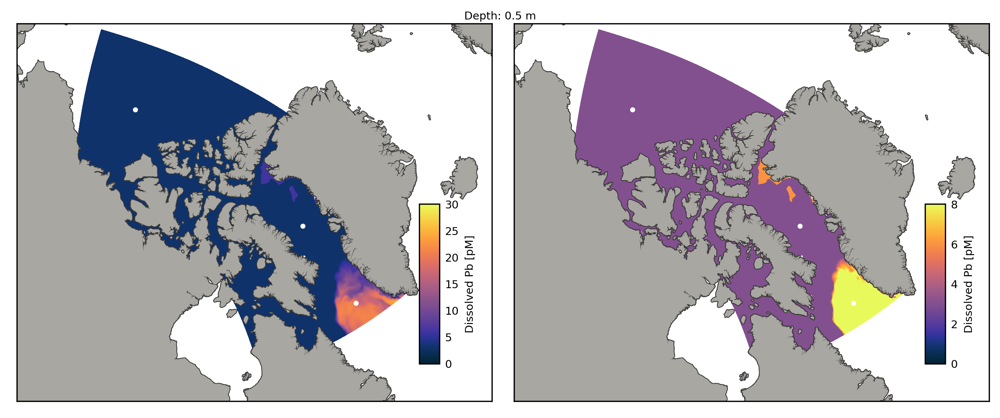

In [338]:
plot_layer(overall_IC, 0, vm1=(0,30), vm2=(0,8))

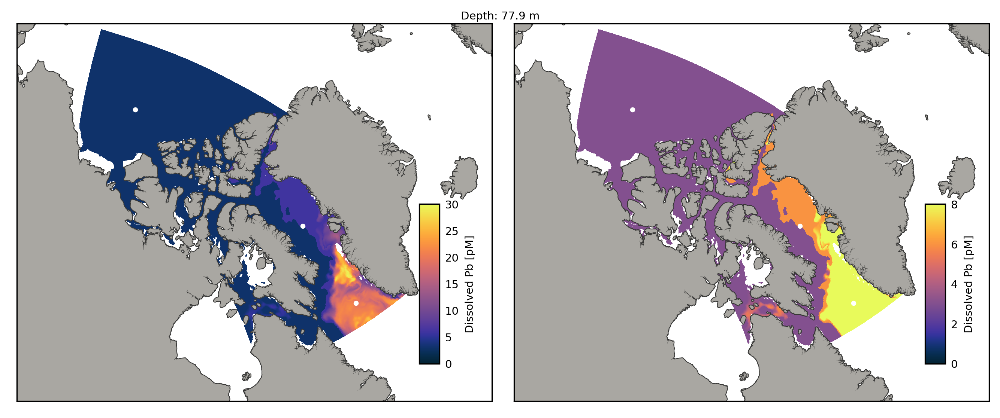

In [339]:
plot_layer(overall_IC, 20, vm1=(0,30), vm2=(0,8))

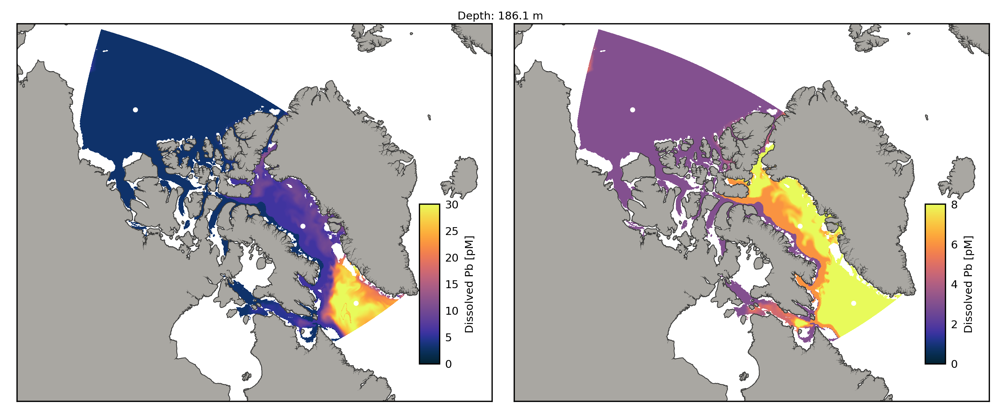

In [340]:
plot_layer(overall_IC, 25, vm1=(0,30), vm2=(0,8))

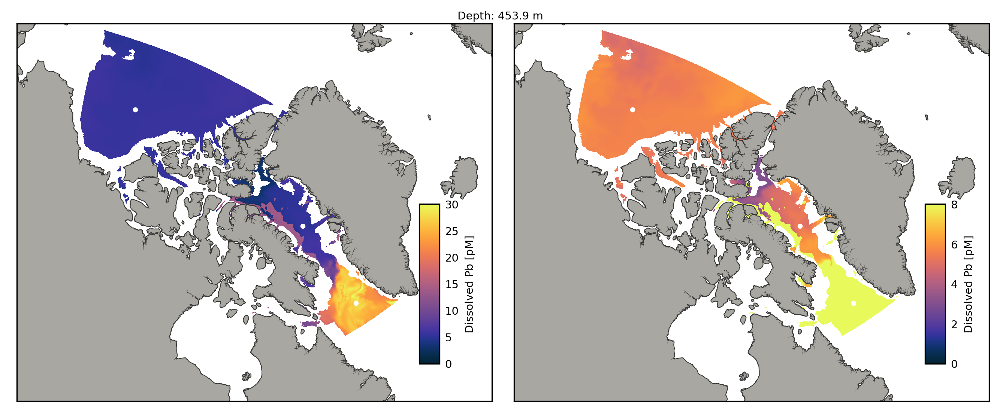

In [341]:
plot_layer(overall_IC, 30, vm1=(0,30), vm2=(0,8)) 

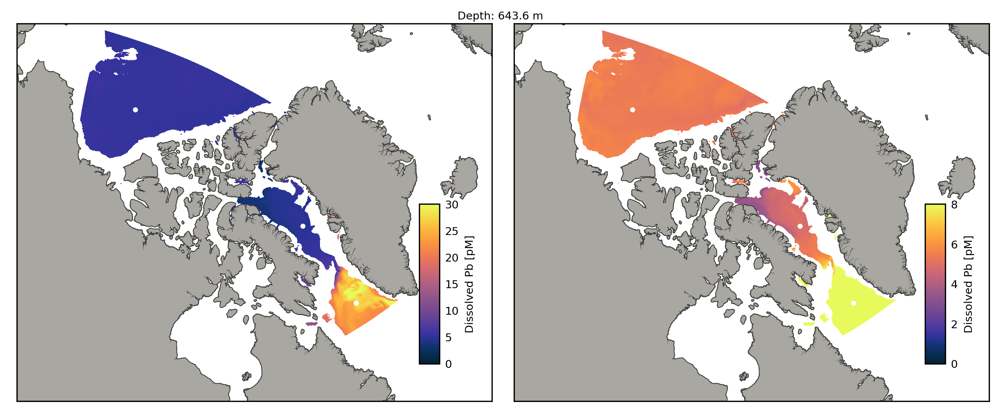

In [342]:
plot_layer(overall_IC, 32, vm1=(0,30), vm2=(0,8))

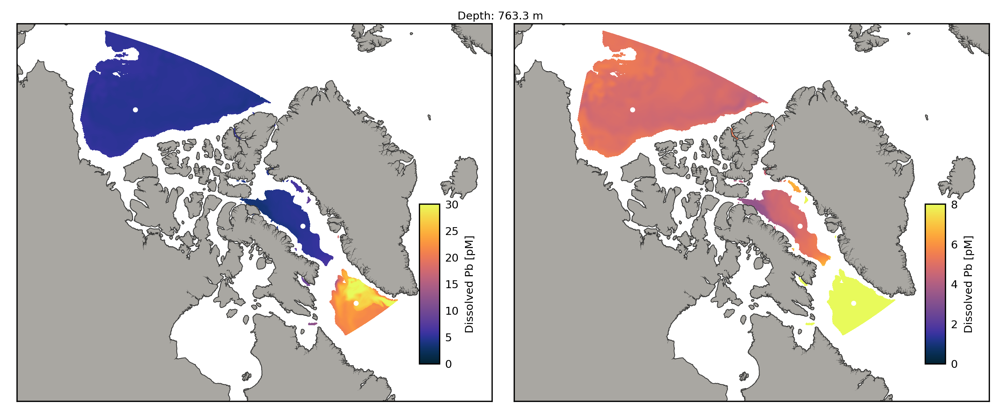

In [343]:
plot_layer(overall_IC, 33, vm1=(0,30), vm2=(0,8))

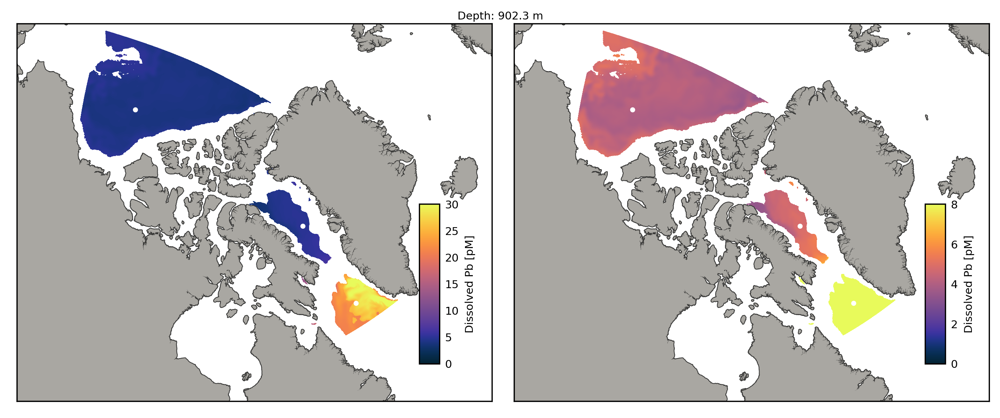

In [344]:
plot_layer(overall_IC, 34, vm1=(0,30), vm2=(0,8))

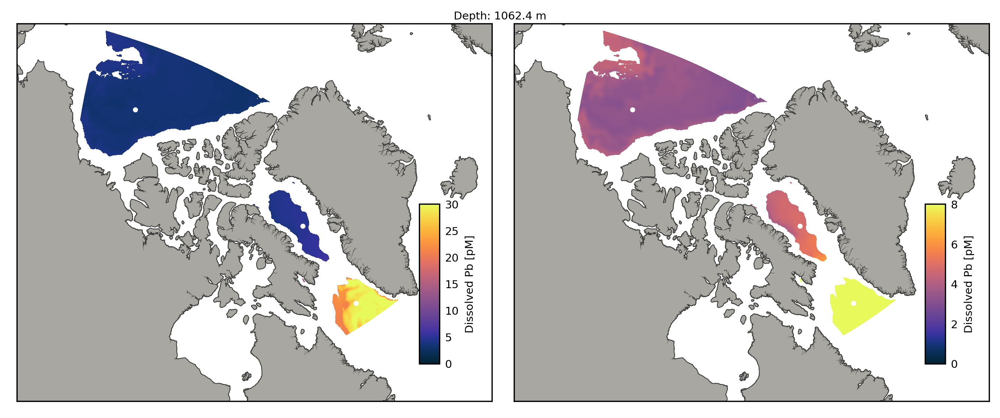

In [345]:
plot_layer(overall_IC, 35, vm1=(0,30), vm2=(0,8))

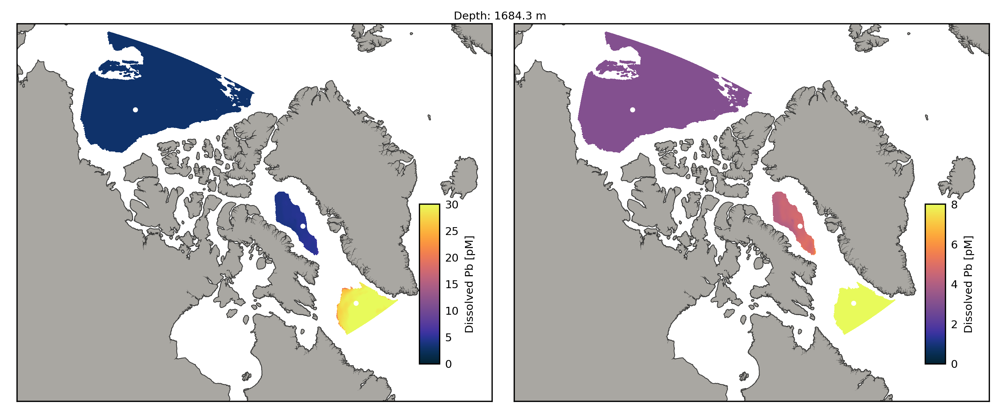

In [346]:
plot_layer(overall_IC, 38, vm1=(0,30), vm2=(0,8))

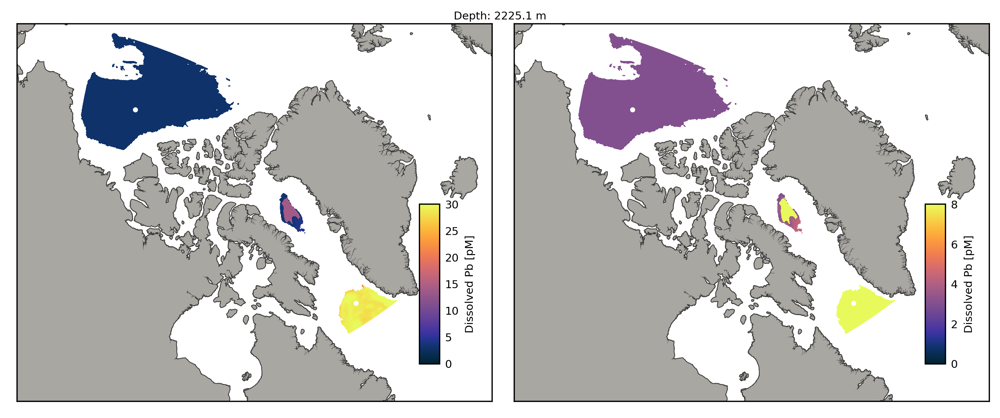

In [347]:
plot_layer(overall_IC, 40, vm1=(0,30), vm2=(0,8))

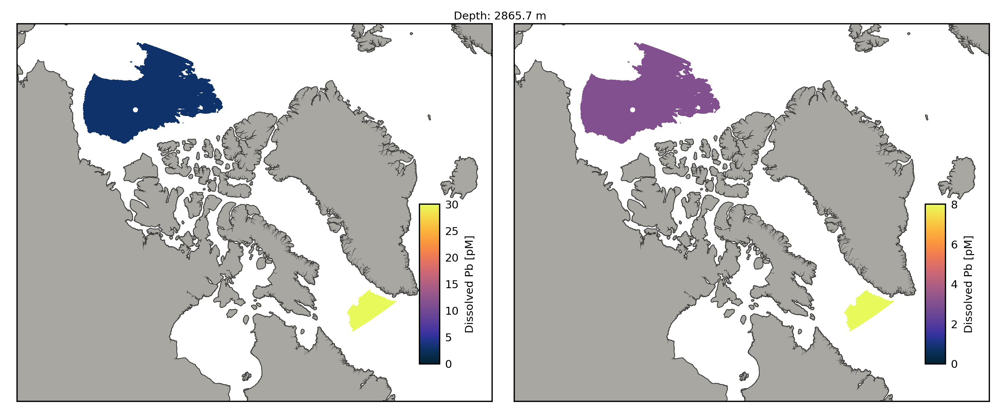

In [348]:
plot_layer(overall_IC, 42, vm1=(0,30), vm2=(0,8))

# Save file

In [354]:
# Check no zeros, NaNs etc.
print(sum(sum(sum(np.isnan(overall_IC)))))
print(sum(sum(sum(overall_IC==0))))
print(np.amin(overall_IC), np.amax(overall_IC), np.mean(overall_IC))
print(overall_IC.shape)

0
0
3e-12 3e-11 8.554304662590305e-12
(50, 2400, 1632)


In [356]:
save_file(overall_IC)